# Joint seismic interpolation and deghosting with Deep Preconditioners

## Author: M.Ravasi

This notebook presents an example of Deep Preconditioned inversion for seismic applications, more specifically to `interpolate and deghost` seismic shot gathers. 

The overall procedure is divided into two phases:

- Representation learning: given patches of the recorded data (in common-receiver domain, an AutoEncoder is trained to identify a strong latent representation of such a dataset;
- Physics-driven inversion: the trained Decoder is now used as a nonlinear preconditioner to the solution of the joint interpolation and deghosting problem.

We will be applying here the procedure to a synthetic dataset created from a simple layered geology with a syncline as shown below.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import pylops

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.sparse import csr_matrix, vstack
from scipy.signal import filtfilt, convolve
from scipy.linalg import lstsq, solve
from scipy.sparse.linalg import LinearOperator, cg, lsqr
from scipy import misc
from torchsummary import summary
from pytorch_lightning import seed_everything
from pytorch_lightning.callbacks.early_stopping import EarlyStopping as pl_EarlyStopping

from pylops.utils import dottest
from pylops.utils.wavelets import *
from pylops.utils.tapers import *
from pylops.basicoperators import *
from pylops.signalprocessing import *
from pylops.waveeqprocessing.oneway import PhaseShift, Deghosting
from pylops.optimization.sparsity  import *

from pylops_gpu import TorchOperator
from pylops_gpu import Restriction as gRestriction

from deepprecs.ghost import deghosting
from deepprecs.invert import InvertAll
from deepprecs.model import AutoencoderBase, AutoencoderRes, AutoencoderMultiRes
from deepprecs.patching import patching, patch_scalings
from deepprecs.subsampling import subsampling 
from deepprecs.train_pl import *
from deepprecs.utils import set_seed

## Parameters

In [2]:
################# GLOBAL ####################
# Device
devicenum = 0
device = torch.device(f"cuda:{devicenum}" if torch.cuda.is_available() else "cpu")
print(device)
if 'cuda' in str(device):
    import cupy as cp

# Seed
seed_everything(5)

# Input filepath
inputfile = '../../data/marmousi/input.npz'

# Model and figure directories
label = 'marmousi'
outputmodels = f'../../models/{label}'
outputfigs = f'../../figures/{label}'

################# TRAINING ####################

# Patches
nspatch, ntpatch = 64, 64
nsjump, ntjump = 32, 32

# Experiment number and name
iexp = 13
expname = 'ResNet network with more filters 300enc - mse+ccc cost with learned weigths + mask'

# AE parameters
aetype = AutoencoderRes # AE type: AutoencoderBase, AutoencoderRes, AutoencoderMultiRes
nenc = 300 # Size of latent space
kernel_size = 5 # Size of filters kernels
nfilts = 32 # number of filters for conv layers in first level (doubles up going down)
nlayers = 2 # number of layers per level 
nlevels = 2 # number of levels
convbias = True # add bias to convolution layers 
downstride = 1 # stride of downsampling/pooling blocks (same will be used for upsampling blocks)
downmode = 'max' # type of pooling (avg or max)
upmode = 'upsample' # type of upsampling (convtransp, upsample or upsample1d)
bnormlast = True # add batch normalization to the last layer
act_fun = 'LeakyReLU' # activation function for all hidden layers
relu_enc = False # add ReLU activation to the linear layer of the encoder (this and tanh_enc cannot be both true)
tanh_enc = True # add TanH activation to the linear layer of the encoder
relu_dec = True # add ReLU activation to the linear layer of the decoder
tanh_final = False # add TanH activation to the last layer of the network - ensures the output is bounded between [-1, 1]

# Loss/optimizer
loss = 'mse_ccc' # loss: mse, weightmse, l1, ssim, peaerson, mse_pearson, l1_pearson, ccc, mse_ccc, l1_ccc
lossweights = None
betas = (0.5, 0.9) # betas of Adam optimizer
weight_decay = 1e-5 # weigth decay of Adam optimizer
learning_rate = 1e-4 # learning rate of Adam optimizer
adapt_learning = True # apply adaptive learning rate
lr_scheduler = 'OneCycle' # type of adaptive learning rate: OnPlateau, OneCycleLR
lr_factor = None # lr factor for OnPlateau
lr_thresh = None # lr thresh for OnPlateau
lr_patience = None # lr patience for OnPlateau
lr_max = 1e-3 # lr max for OneCycleLR
early_stop = True # apply early stopping
es_patience = 10 # early stopping patience
es_min_delta = 1e-3 # min difference to trigger early stopping

# Training
num_epochs = 40 # number of epochs
batch_size = 256 # batch size
noise_std = 0.0 # standard deviation noise to input
mask_perc = 0.2 # percentage of traces to mask

# Miscellaneous
plotflag = True # visualize intermediate training results
loadmodel = False # load pretrained model with number of iexp


####### DEGHOSTING AND INTERPOLATION #######
# Source index to be used for inversion
isrc_rec = 100

# Direct wave window
toff = 0.06 # time offset
nsmoothwin = 5 # size of smoothing to apply to window

# Ghost  operator
vel_sep = 1500.0 # velocity at separation level
rho_sep = 1000.0 # density at separation level
nxpad = 20 # size of padding along x-axis prior to applying ghost model
ntaper = 11 # size of spatial taper along-x axis prior to applying ghost model

# Restriction operator
kind = 'irreg'
perc = 0.4

# Patching operator
nwin = (nspatch, ntpatch)
nover = (19, 8)
nop = (nspatch, ntpatch)
npatches = (4, 49)

INFO: Global seed set to 5


cuda:0


## Load data

Let's start by importing the dataset we are going to use for this example

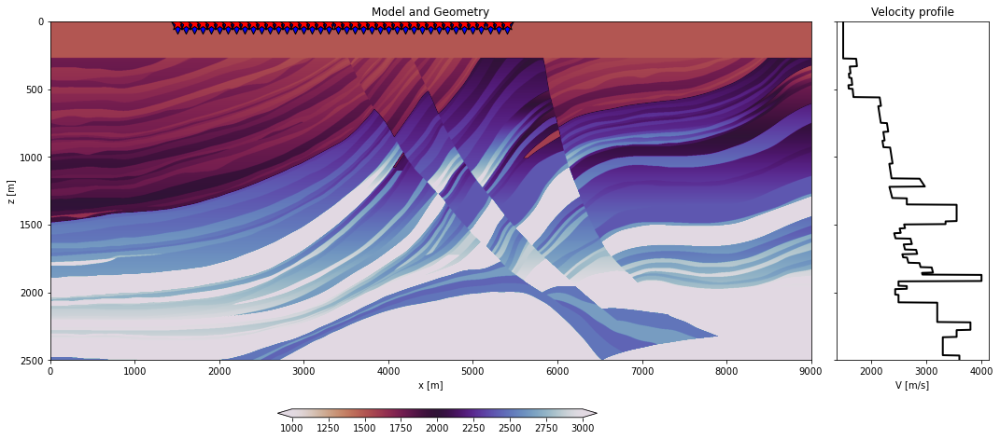

In [3]:
inputdata = np.load(inputfile)

# Receivers
r = inputdata['r'][:, :199]
nr = r.shape[1]
dr = r[0, 1] - r[0, 0]

# Sources
s = inputdata['s'][:, :199]
ns = s.shape[1]

# Model
rho = inputdata['rho']
vel = inputdata['vel']

# Axes
t = inputdata['t']
x, z = inputdata['x'], inputdata['z']
nt, dt = len(t), t[1]-t[0]
dx, dz = x[1] - x[0], z[1] - z[0]

# Load data
p = inputdata['p'][:199, :, :199].transpose(0, 2, 1)
p /= p.max()

# Convolve with wavelet
fwav = 15
wav, _, wav_c = ricker(t[:201], fwav)
p = np.apply_along_axis(convolve, -1, p, wav, mode='full')
p = p[:, :, wav_c:][:, :, :nt]

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 6), sharey=True, gridspec_kw={'width_ratios': [5, 1]})
axins1 = inset_axes(axs[0],
                    width="70%",  # width = 50% of parent_bbox width
                    height="5%",  # height : 5%
                    bbox_to_anchor=(0.125, -0.63, .6, .5),
                    bbox_transform=axs[0].transAxes)
im = axs[0].imshow(vel, extent = (x[0], x[-1], z[-1], z[0]), vmin=1000, vmax=3000, cmap='twilight_r')
axs[0].scatter(r[0, ::5],  r[1, ::5], marker='v', s=150, c='b', edgecolors='k')
axs[0].scatter(s[0, ::5], s[1, ::5], marker='*', s=250, c='r', edgecolors='k')
axs[0].axis('tight')
axs[0].set_xlabel('x [m]')
axs[0].set_ylabel('z [m]')
axs[0].set_title('Model and Geometry')
axs[0].set_xlim(x[0], x[-1])
axs[0].set_ylim(z[-1], z[0])
fig.colorbar(im, cax=axins1, orientation='horizontal', extend="both", fraction=0.046, pad=0.12) 
axs[1].plot(vel[:, len(x)//2], z, 'k', lw=2)
axs[1].set_title('Velocity profile')
axs[1].set_xlabel('V [m/s]')
plt.tight_layout()
plt.savefig(os.path.join(outputfigs, f'{label}_model.eps'), dpi=100, bbox_inches='tight')

## Deghosting problem

Before we start our training process, let's define the ghosting and restriction operators to be used in the subsequent inversion process. 

We will provide our network with such an operator so that later we can apply it directly to the output of its decoder

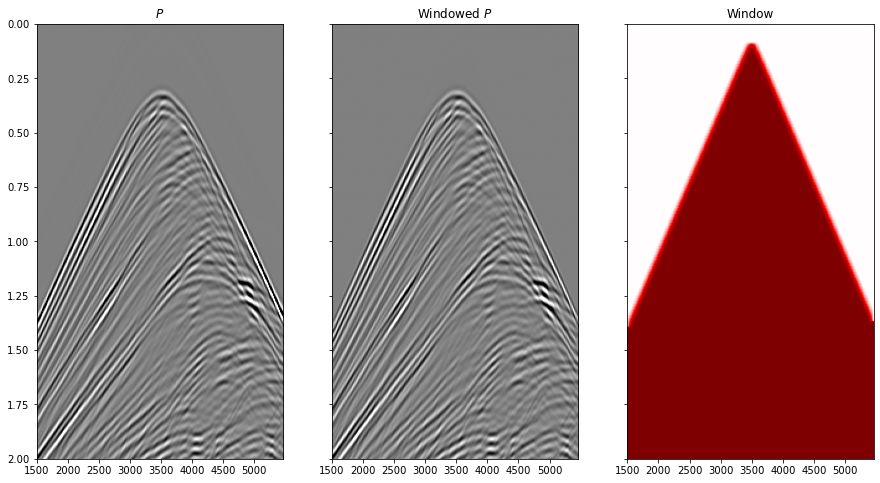

In [4]:
# Ghost operator
win, Dupop = deghosting(s, r, isrc_rec, nt, dt, dz, vel_sep, toff, nsmoothwin, nxpad, ntaper)

# Visualize
clip = 0.2
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 8))
axs[0].imshow(p[isrc_rec].T, cmap='gray', 
              vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max(),
              extent=(r[0, 0], r[0, -1], t[-1], t[0]))
axs[0].set_title(r'$P$')
axs[0].axis('tight')
axs[1].imshow(win * p[isrc_rec].T, cmap='gray', 
              vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max(),
              extent=(r[0, 0], r[0, -1], t[-1], t[0]))
axs[1].set_title(r'Windowed $P$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0)
axs[2].imshow(win, cmap='seismic', vmin=-1, vmax=1,
              extent=(r[0, 0], r[0, -1], t[-1], t[0]))
axs[2].set_title(r'Window')
axs[2].axis('tight')
axs[2].set_ylim(2, 0);

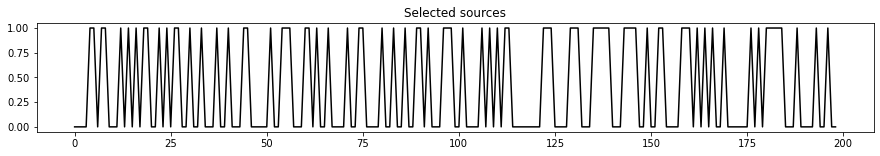

In [5]:
# Restriction operator
iava, mask = subsampling(ns, kind=kind, perc=perc)
Rop = Restriction(ns*nt, iava, dims=(ns, nt), dir=0, dtype='float32')

plt.figure(figsize=(15, 2))
plt.plot(mask, 'k')
plt.title('Selected sources');

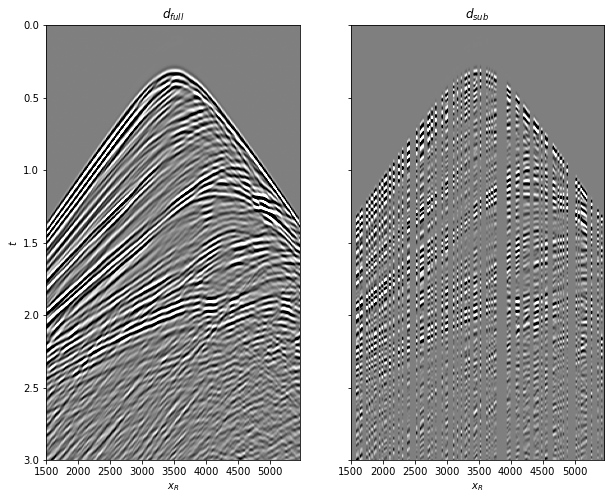

In [6]:
# Create full  and masked data
dfull = win.T * p[isrc_rec] 
d = Rop * dfull.ravel()

dmask = Rop.H * d
dmask = dmask.reshape(nr, nt)

# Convert data to torch
d_torch = torch.from_numpy(d.astype(np.float32)).to(device)
dmask_torch = torch.from_numpy(dmask.astype(np.float32)).to(device)

# Visualize
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(10, 8))
axs[0].imshow(dfull.T, cmap='gray',  
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(), 
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[0].set_title(r'$d_{full}$')
axs[0].set_xlabel(r'$x_R$')
axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dmask.T, cmap='gray', 
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(),
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[1].set_title(r'$d_{sub}$')
axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(3, 0);

  896  960 1024 1088 1152 1216 1280 1344 1408 1472 1536 1600 1664 1728
 1792 1856 1920 1984 2048 2112 2176 2240 2304 2368 2432 2496 2560 2624
 2688 2752 2816 2880 2944 3008 3072], end:[  64  128  192  256  320  384  448  512  576  640  704  768  832  896
  960 1024 1088 1152 1216 1280 1344 1408 1472 1536 1600 1664 1728 1792
 1856 1920 1984 2048 2112 2176 2240 2304 2368 2432 2496 2560 2624 2688
 2752 2816 2880 2944 3008 3072 3136]
  784  840  896  952 1008 1064 1120 1176 1232 1288 1344 1400 1456 1512
 1568 1624 1680 1736 1792 1848 1904 1960 2016 2072 2128 2184 2240 2296
 2352 2408 2464 2520 2576 2632 2688], end:[  64  120  176  232  288  344  400  456  512  568  624  680  736  792
  848  904  960 1016 1072 1128 1184 1240 1296 1352 1408 1464 1520 1576
 1632 1688 1744 1800 1856 1912 1968 2024 2080 2136 2192 2248 2304 2360
 2416 2472 2528 2584 2640 2696 2752]


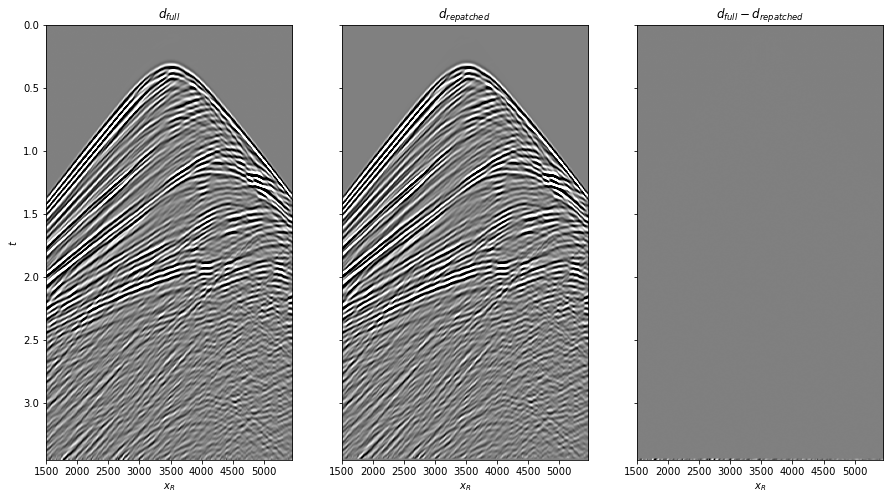

In [7]:
# Patch operator
dimsd = (ns, nt)
dims = (npatches[0]*nspatch, npatches[1]*ntpatch)

Op = Identity(nspatch*ntpatch, dtype='float32')
Pop = Patch2D(Op, dims, dimsd, nwin, nover, nop,
              tapertype=None, design=True)
Pop1 = Patch2D(Op.H, dims, dimsd, nwin, nover, nop,
              tapertype='cosine', design=False)
Pop1_torch = TorchOperator(Pop1, pylops=True, device=device)

# Create patches and revert back
dfull_patches = Pop.H * dfull.ravel()
dfull_patches = dfull_patches.reshape(dims)
dfull_repatched = Pop1 * dfull_patches.ravel()
dfull_repatched = dfull_repatched.reshape(dimsd)

# Visualize
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 8))
axs[0].imshow(dfull.T, cmap='gray',  
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(), 
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[0].set_title(r'$d_{full}$')
axs[0].set_xlabel(r'$x_R$')
axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dfull_repatched.T, cmap='gray', 
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(),
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[1].set_title(r'$d_{repatched}$')
axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0)
axs[2].imshow(dfull.T-dfull_repatched.T, cmap='gray', 
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(),
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[2].set_title(r'$d_{full}-d_{repatched}$')
axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight');

Scalings tensor([1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00,
        8.4884e-07, 1.1079e-01, 7.4420e-01, 8.2689e-01, 8.9808e-01, 9.8995e-01,
        1.0385e+00, 1.0385e+00, 9.4209e-01, 8.3476e-01, 7.1290e-01, 1.0496e+00,
        1.0496e+00, 1.0232e+00, 7.1456e-01, 5.2688e-01, 6.0317e-01, 6.4976e-01,
        6.7347e-01, 9.3112e-01, 1.1738e+00, 1.1738e+00, 8.5163e-01, 5.8647e-01,
        6.0868e-01, 6.4543e-01, 6.1692e-01, 5.4717e-01, 4.4880e-01, 3.6278e-01,
        3.1205e-01, 3.0067e-01, 3.2930e-01, 2.5843e-01, 2.6182e-01, 2.4779e-01,
        3.2846e-01, 2.4809e-01, 2.1671e-01, 2.7822e-01, 2.3705e-01, 2.7098e-01,
        3.4587e-01, 1.0000e+00, 1.0327e-04, 1.5969e-04, 6.2823e-02, 5.8005e-01,
        6.3389e-01, 6.3389e-01, 5.0342e-01, 7.4420e-01, 8.2689e-01, 8.9808e-01,
        9.8995e-01, 1.0350e+00, 9.4614e-01, 5.6554e-01, 4.6766e-01, 8.3300e-01,
        1.0496e+00, 1.0496e+00, 1.0232e+00, 6.9648e-01, 6.3525e-01, 6.5431e-01,
        6.4976e-01, 6.5319e-01,

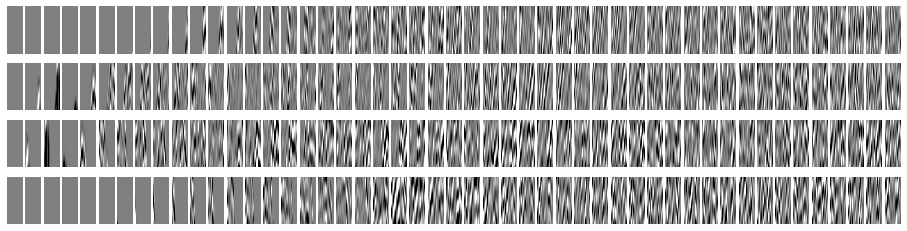

In [8]:
# Find scalings
scalings = patch_scalings(dmask, Pop, npatches, npatch=(nspatch, ntpatch), 
                          plotflag=True, clip=clip, device=device)


In [9]:
# Overall operator
RDupop = Rop * Dupop
RDupop_torch = TorchOperator(RDupop, pylops=True, device=device);

## Dataset generation

Let's now generate the training dataset by patching up the available seismic data

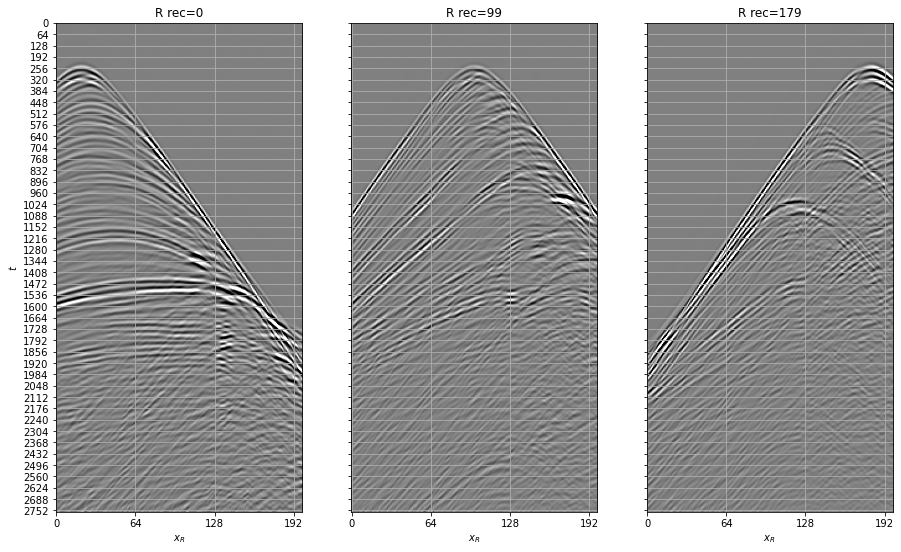

In [10]:
# Visualize receiver gathers
cmax = 0.1

fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 9))
axs[0].imshow(p[:, 20].T, cmap='gray', vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max())
axs[0].set_title('R rec=0'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_xticks(np.arange(0, nr, nspatch))
axs[0].set_yticks(np.arange(0, nt, ntpatch))
axs[0].grid(which='both');
axs[1].imshow(p[:, nr//2].T, cmap='gray', vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max())
axs[1].set_title('R rec=%d' %(nr//2)), axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_xticks(np.arange(0, nr, nspatch))
axs[1].set_yticks(np.arange(0, nt, ntpatch))
axs[1].grid(which='both');
axs[2].imshow(p[:, -20].T, cmap='gray', vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max())
axs[2].set_title('R rec=%d' %(nr-20)), axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight');
axs[2].set_xticks(np.arange(0, nr, nspatch))
axs[2].set_yticks(np.arange(0, nt, ntpatch))
axs[2].grid(which='both');

Nsamples: 70524
Nsamples (after augumentation): 74308


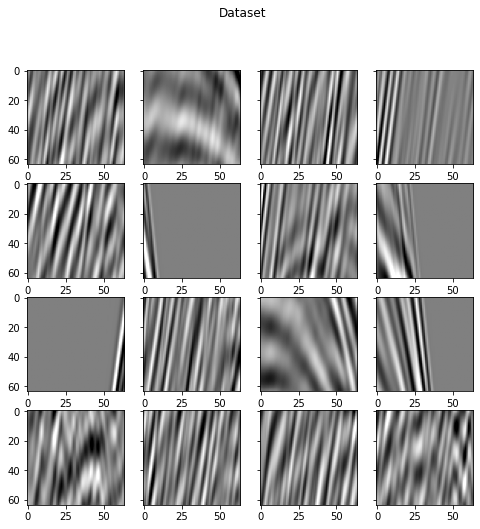

In [11]:
# Create patches
xs = patching(p, s, r, dt, npatch=(nspatch, ntpatch), njump=(nsjump, ntjump), window=True, 
              vel_sep=vel_sep, toff=toff, nsmoothwin=nsmoothwin, thresh=1e-4, augumentdirect=True)

# Visualize
cmax = 0.8
nviz = 4
np.random.seed(5)
ivizs = np.random.permutation(np.arange(len(xs)))[:nviz**2]
fig, axs = plt.subplots(nviz, nviz, sharey=True, figsize=(8, 8))
axs = axs.ravel()
fig.suptitle('Dataset', y=0.99)
for i, iviz in enumerate(ivizs):
    axs[i].imshow(xs[iviz].T, cmap='gray', vmin=-cmax, vmax=cmax)
    axs[i].axis('tight')

## Training

Working with Experiment 13 - ResNet network with more filters 300enc - mse+ccc cost with learned weigths + mask


INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
INFO: 
  | Name    | Type           | Params
-------------------------------------------
0 | network | AutoencoderRes | 15.9 M
-------------------------------------------
15.9 M    Trainable params
0         Non-trainable params
15.9 M    Total params
63.521    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

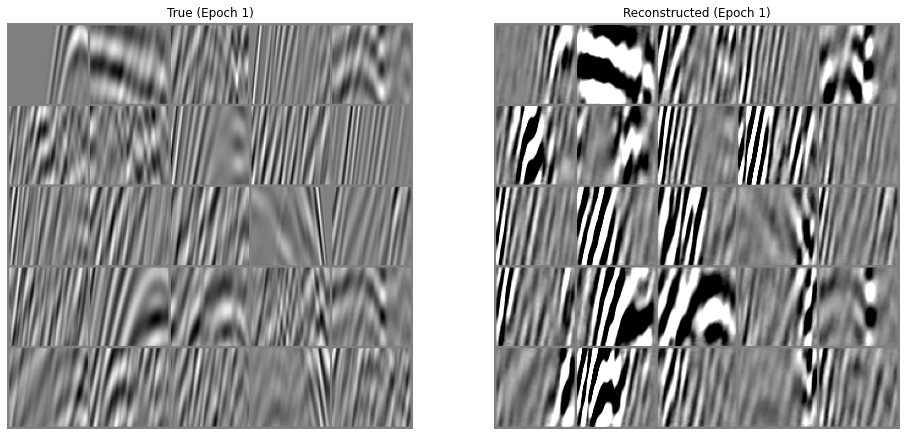

Validation: 0it [00:00, ?it/s]

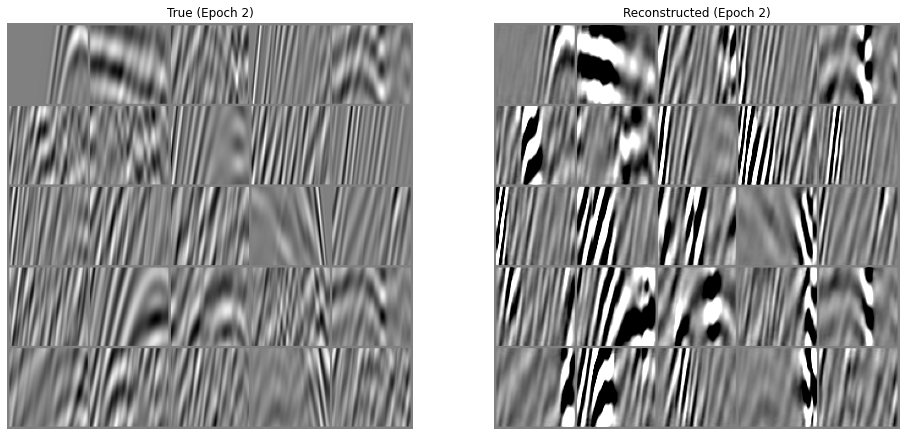

Validation: 0it [00:00, ?it/s]

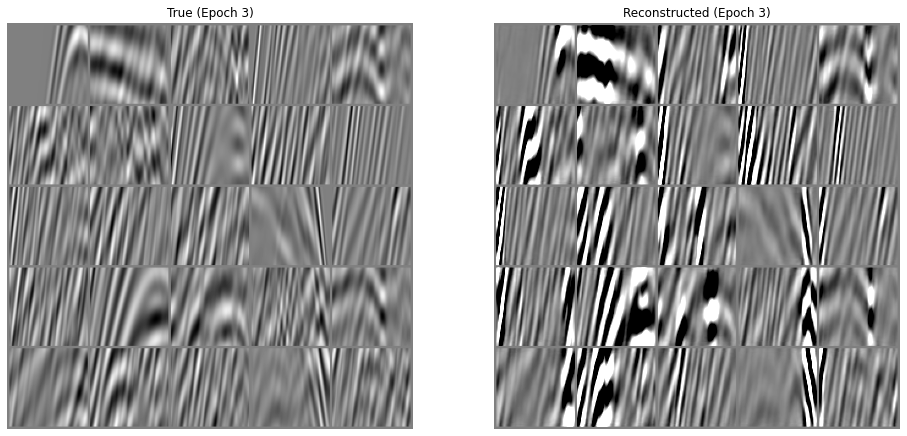

Validation: 0it [00:00, ?it/s]

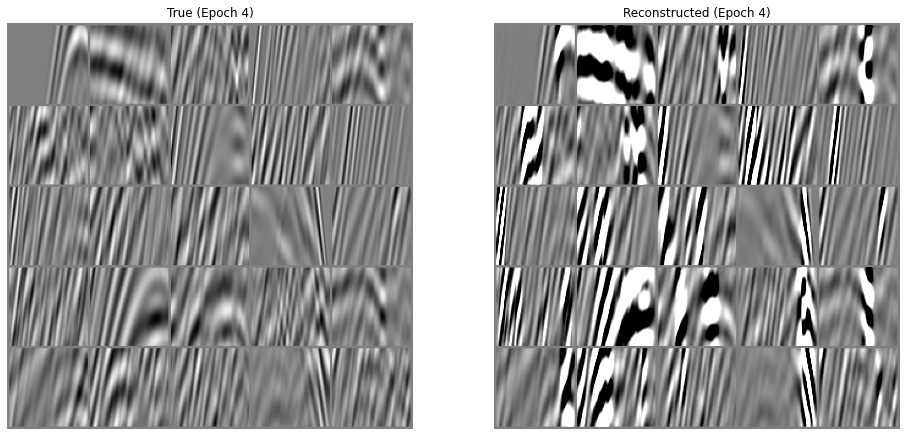

Validation: 0it [00:00, ?it/s]

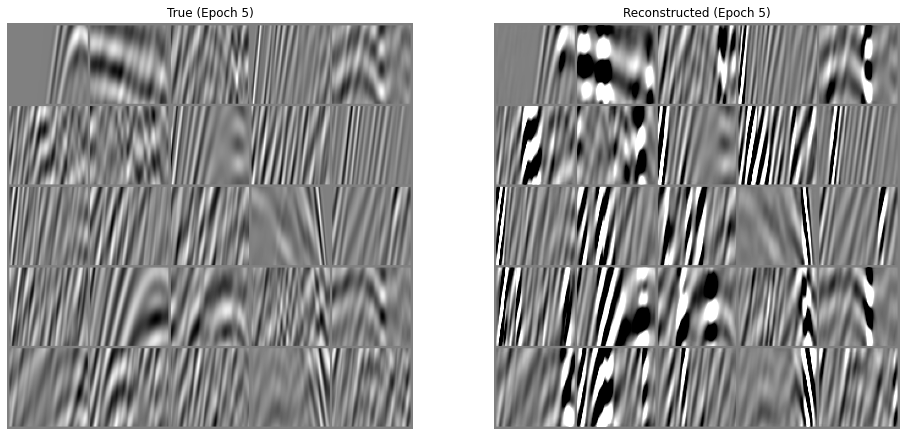

Validation: 0it [00:00, ?it/s]

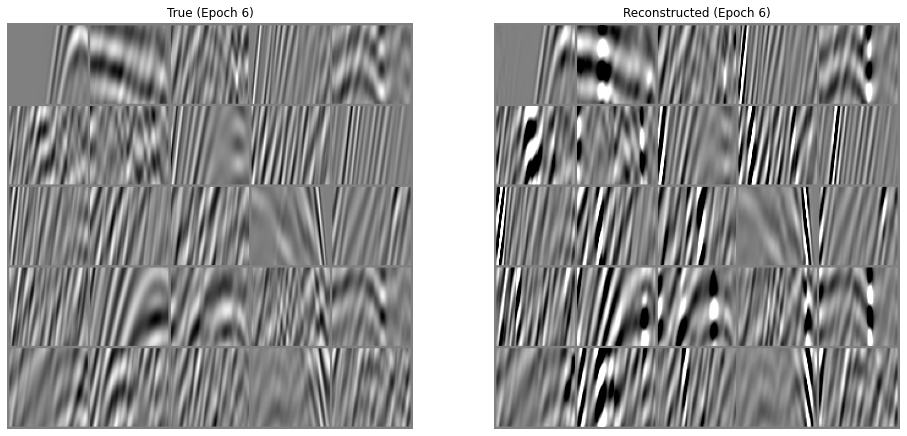

Validation: 0it [00:00, ?it/s]

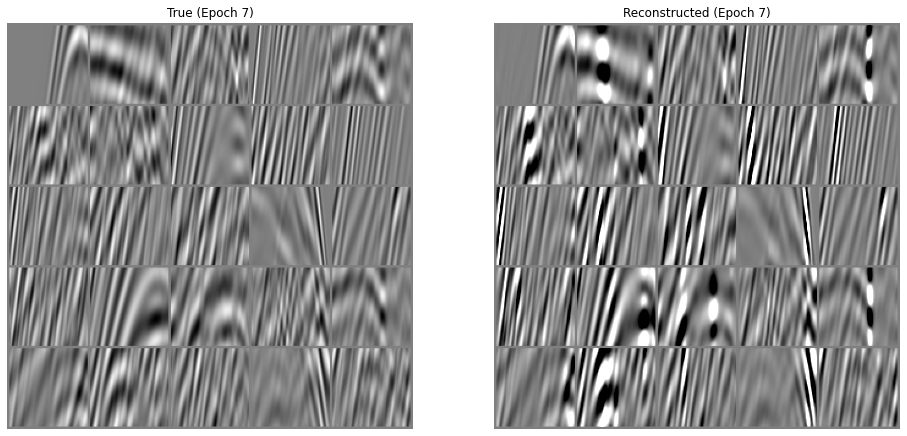

Validation: 0it [00:00, ?it/s]

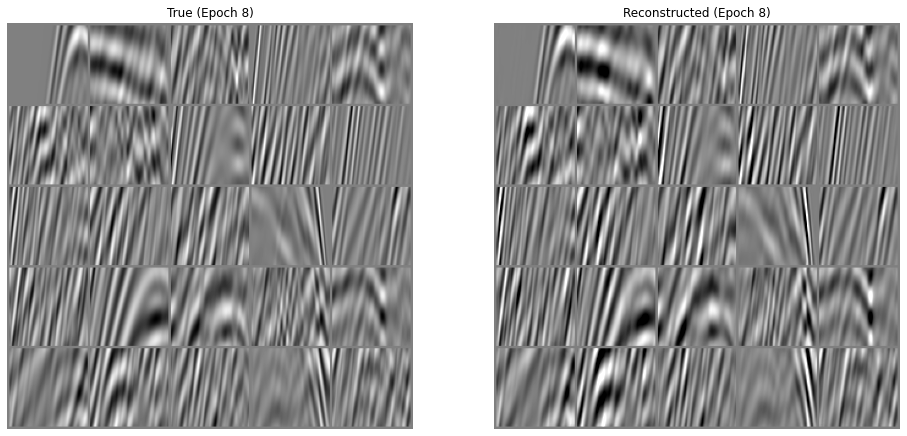

Validation: 0it [00:00, ?it/s]

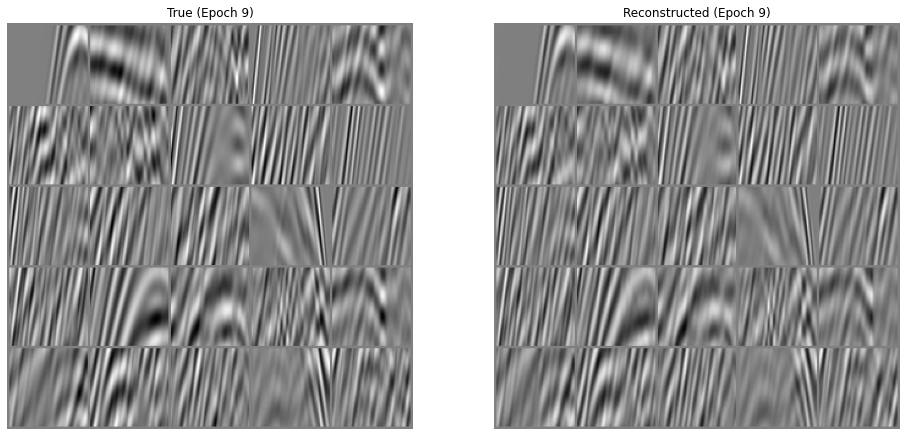

Validation: 0it [00:00, ?it/s]

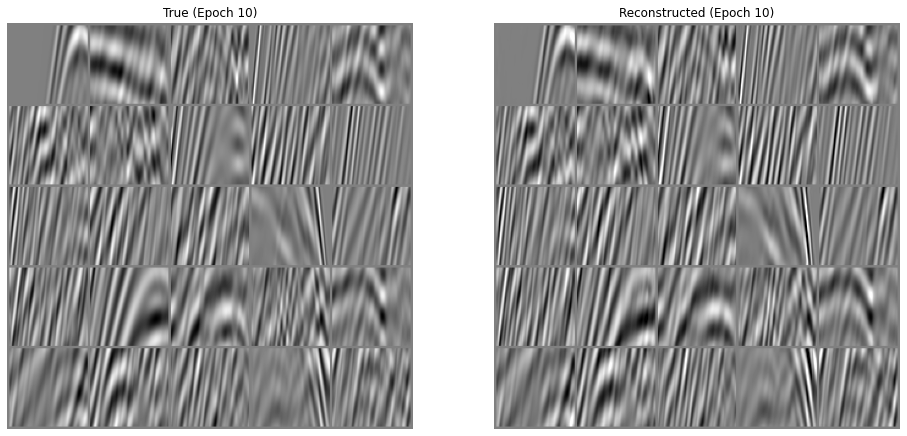

Validation: 0it [00:00, ?it/s]

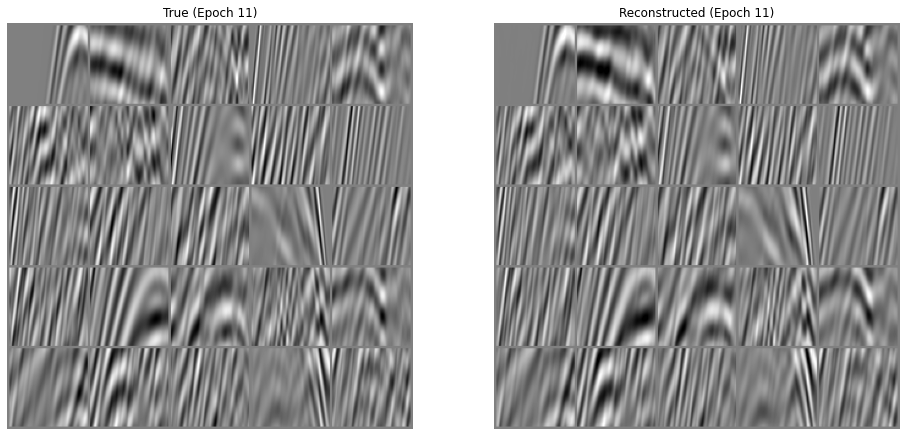

Validation: 0it [00:00, ?it/s]

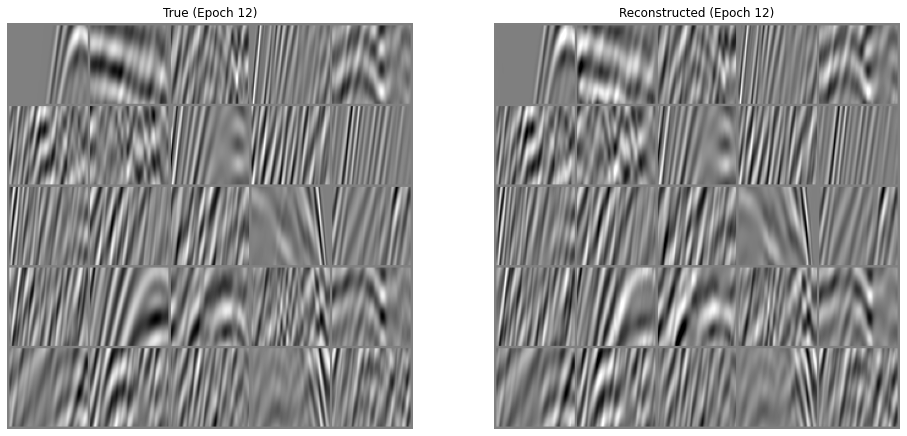

Validation: 0it [00:00, ?it/s]

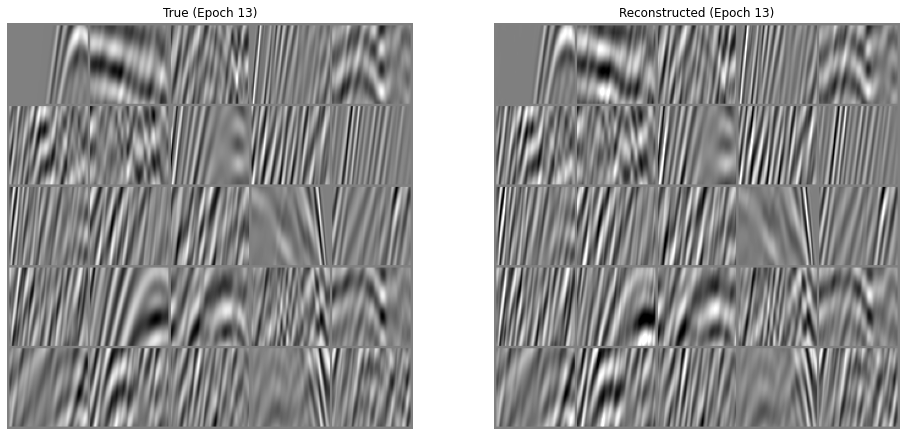

Validation: 0it [00:00, ?it/s]

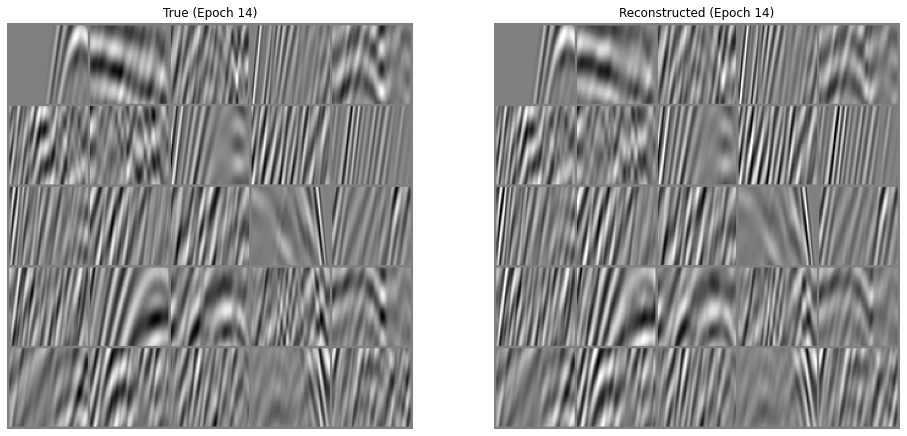

Validation: 0it [00:00, ?it/s]

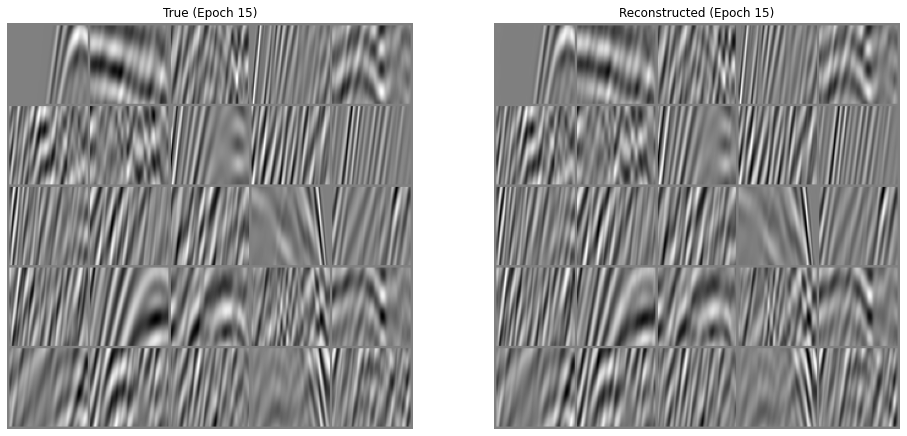

Validation: 0it [00:00, ?it/s]

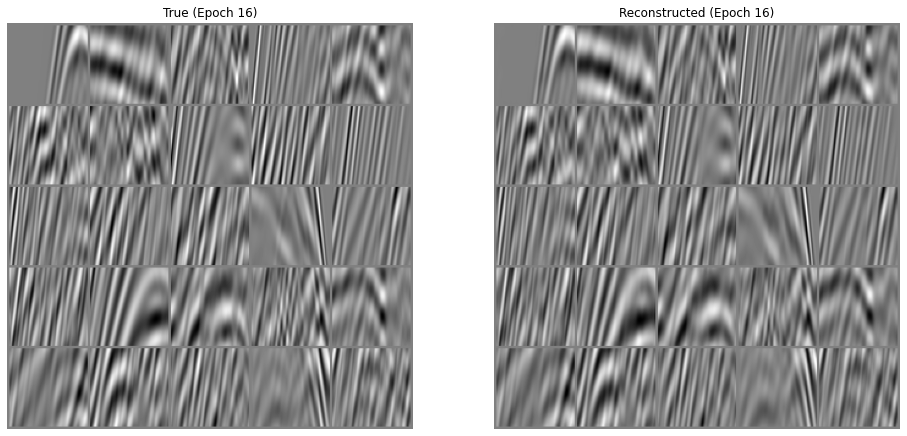

Validation: 0it [00:00, ?it/s]

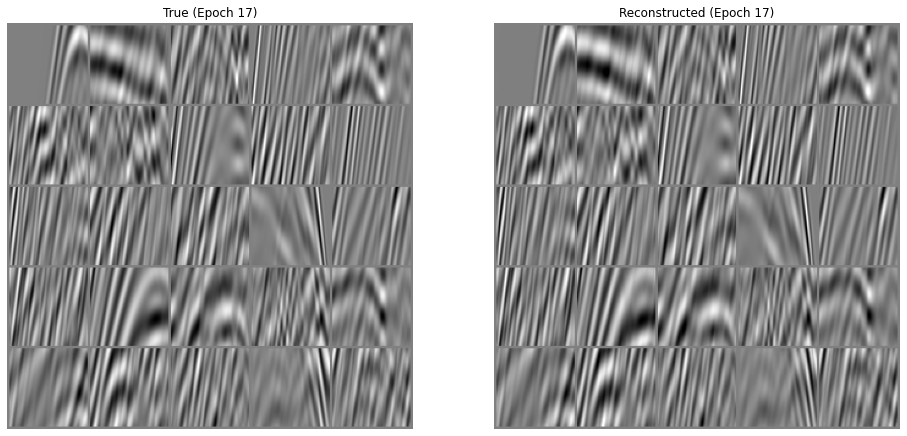

Validation: 0it [00:00, ?it/s]

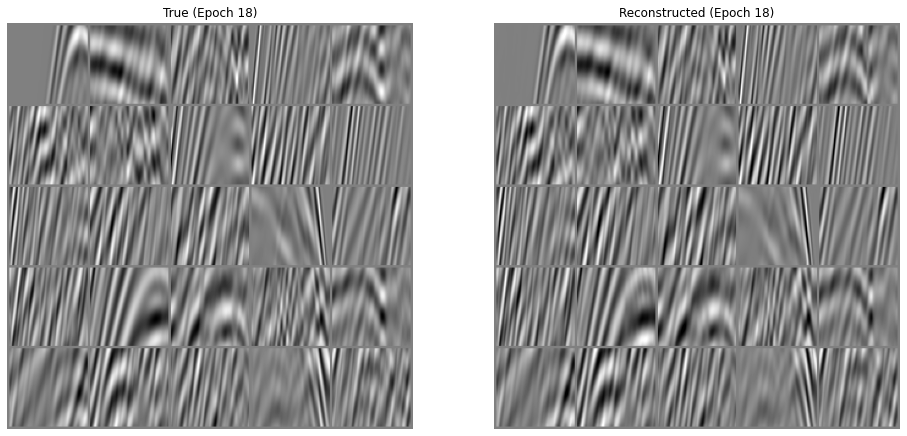

Validation: 0it [00:00, ?it/s]

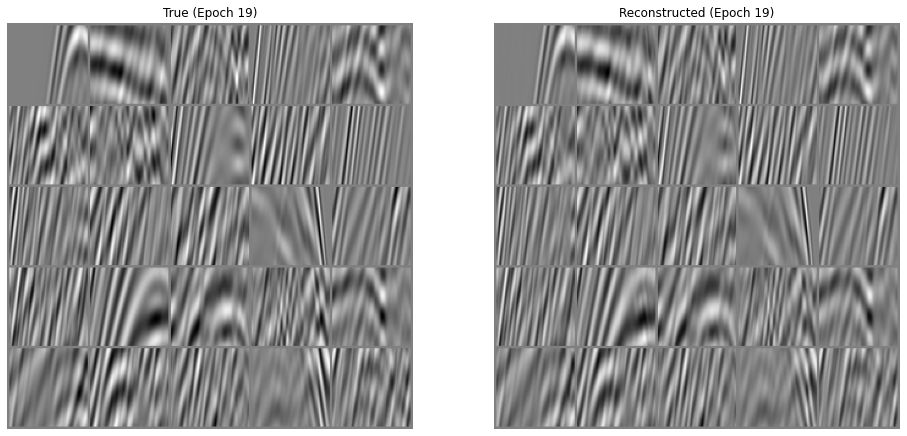

Validation: 0it [00:00, ?it/s]

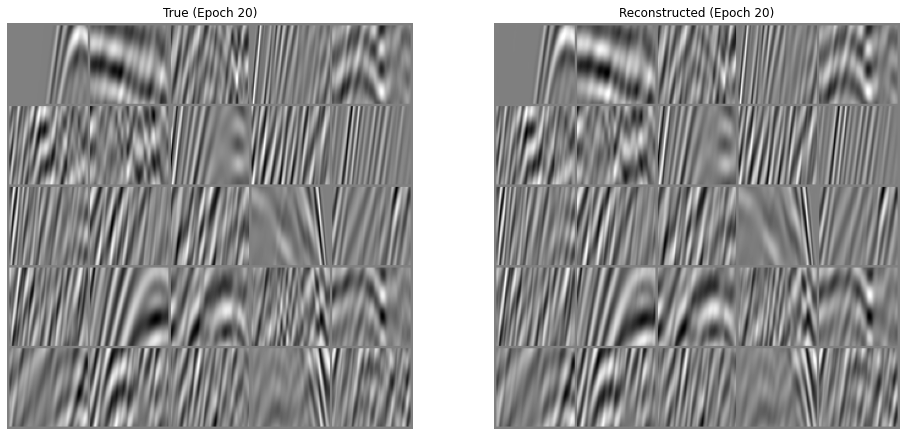

Validation: 0it [00:00, ?it/s]

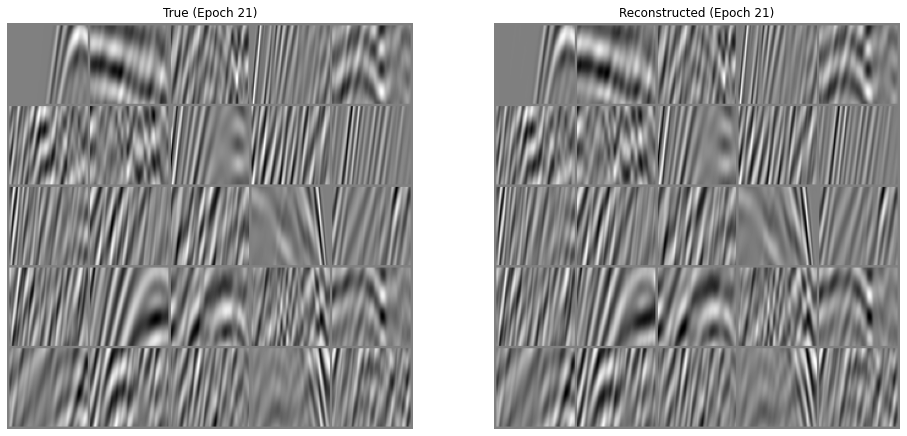

Validation: 0it [00:00, ?it/s]

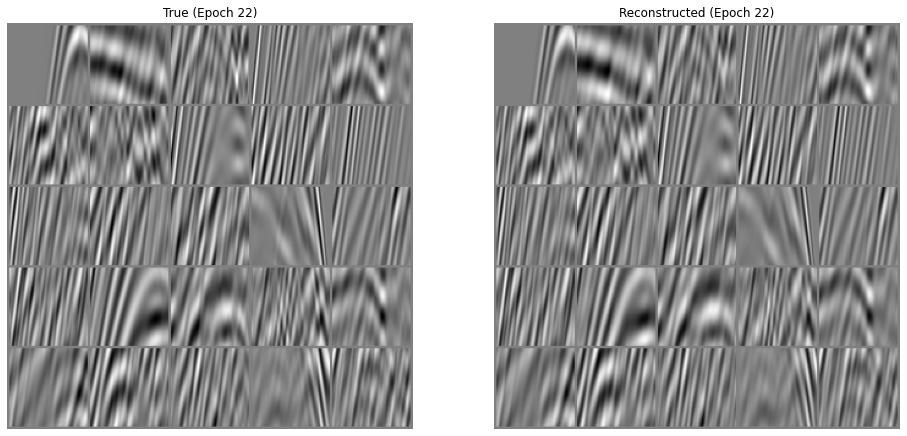

Validation: 0it [00:00, ?it/s]

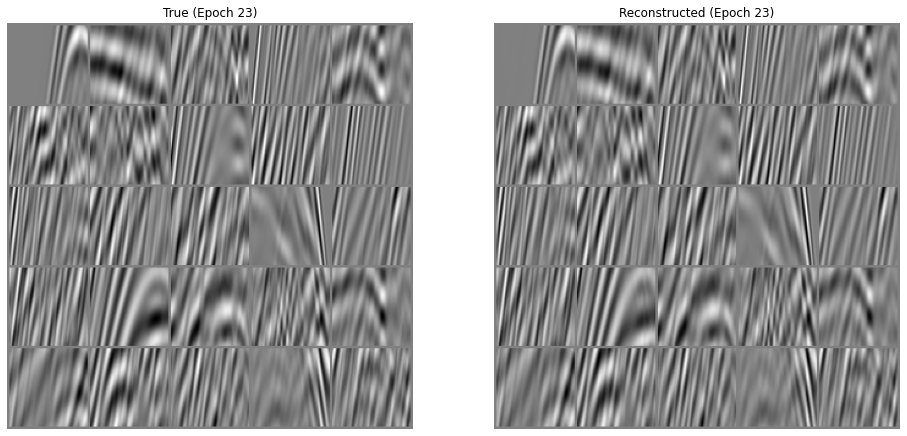

Validation: 0it [00:00, ?it/s]

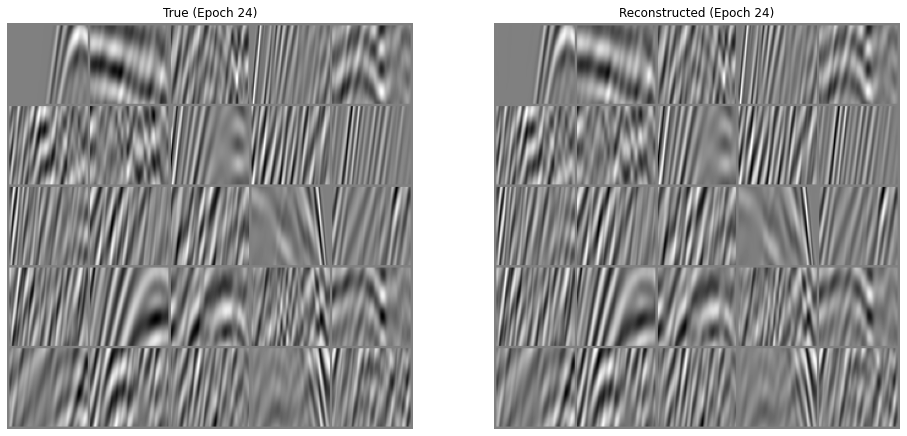

Validation: 0it [00:00, ?it/s]

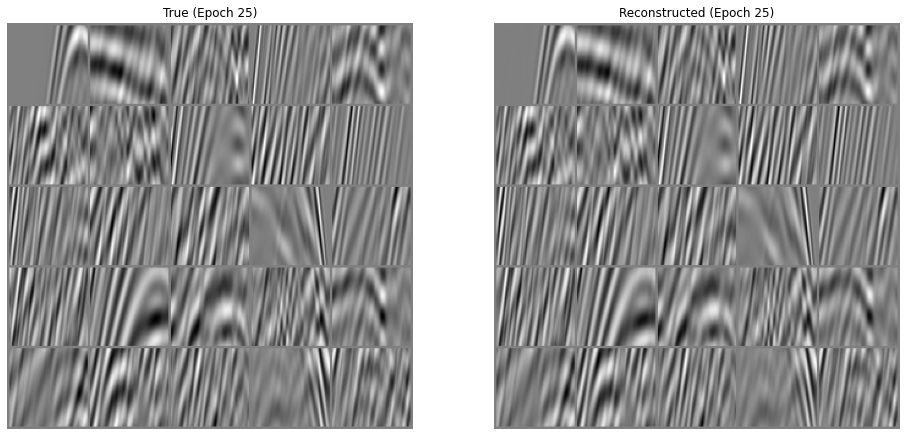

Validation: 0it [00:00, ?it/s]

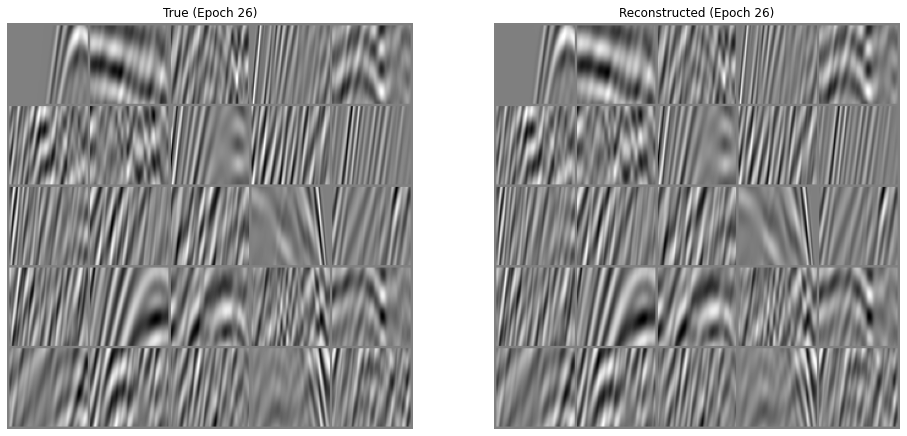

Validation: 0it [00:00, ?it/s]

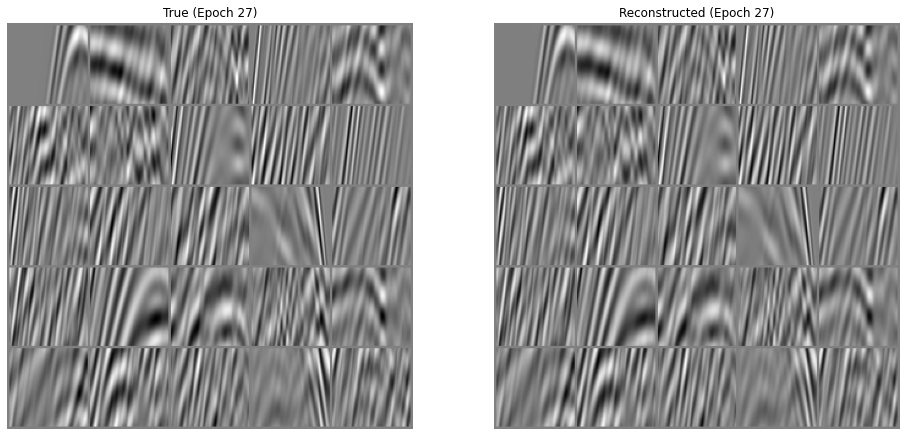

Validation: 0it [00:00, ?it/s]

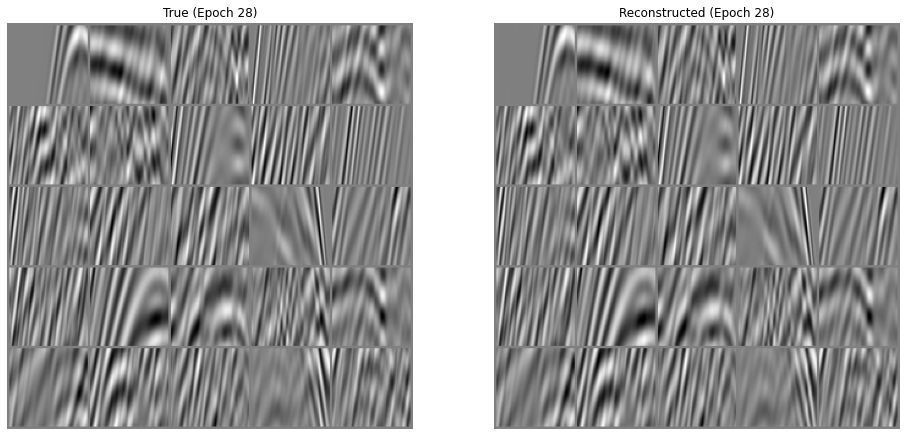

Validation: 0it [00:00, ?it/s]

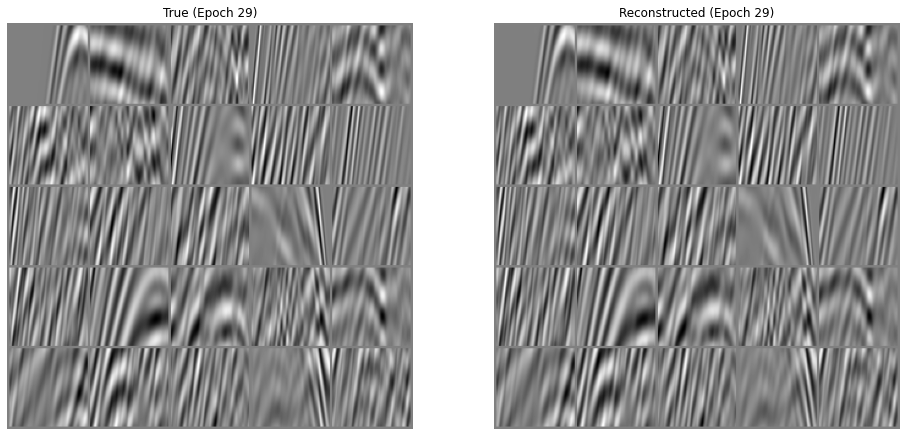

Validation: 0it [00:00, ?it/s]

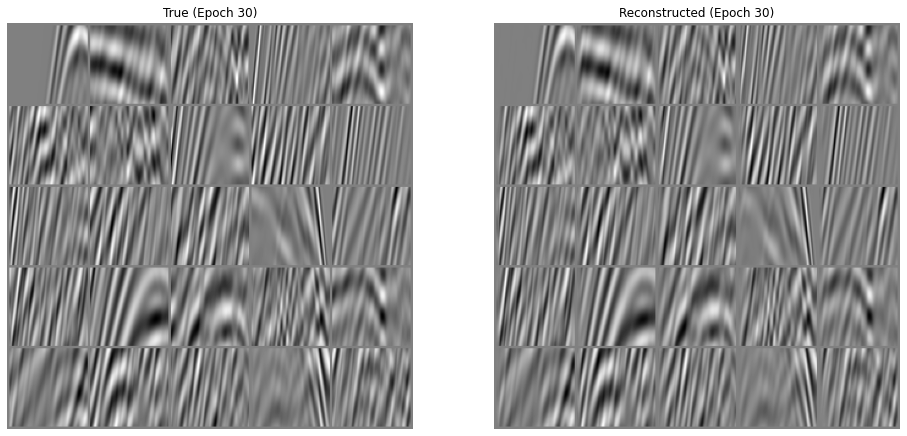

Validation: 0it [00:00, ?it/s]

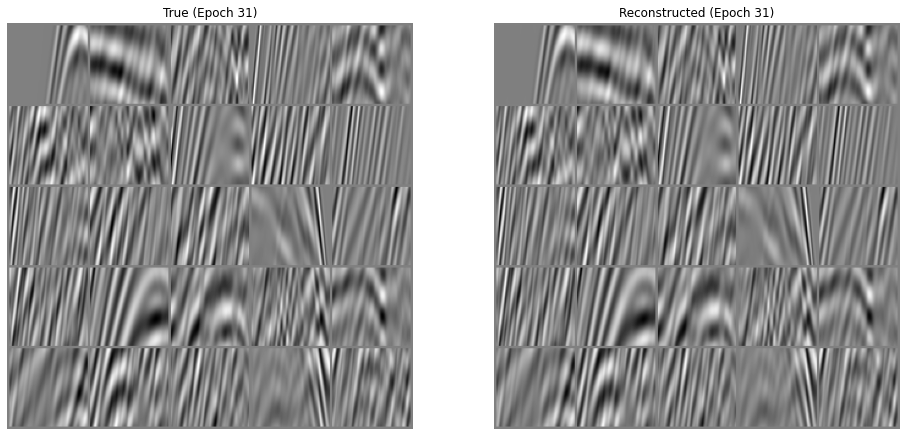

Validation: 0it [00:00, ?it/s]

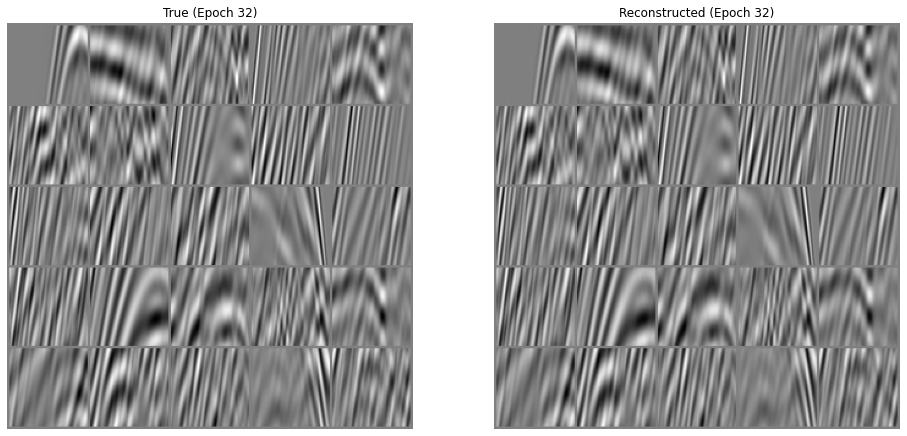

Validation: 0it [00:00, ?it/s]

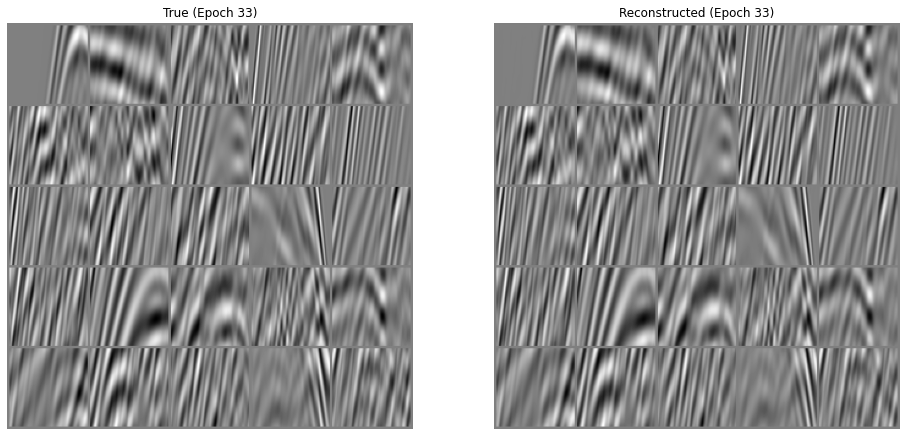

Validation: 0it [00:00, ?it/s]

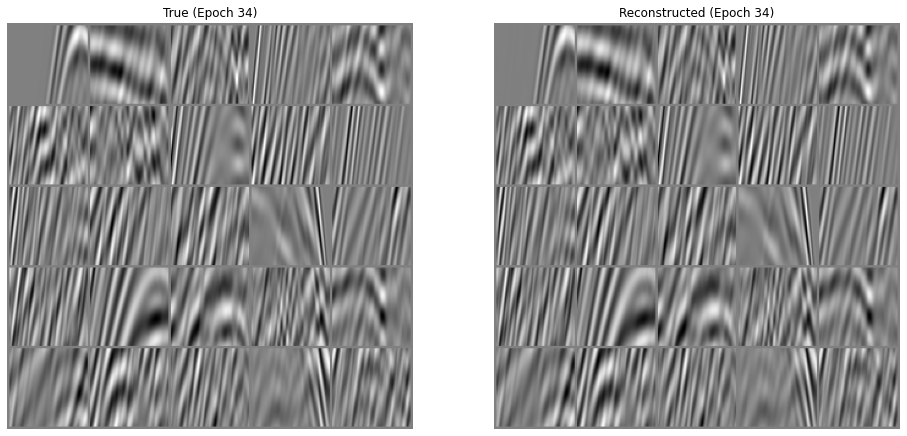

Validation: 0it [00:00, ?it/s]

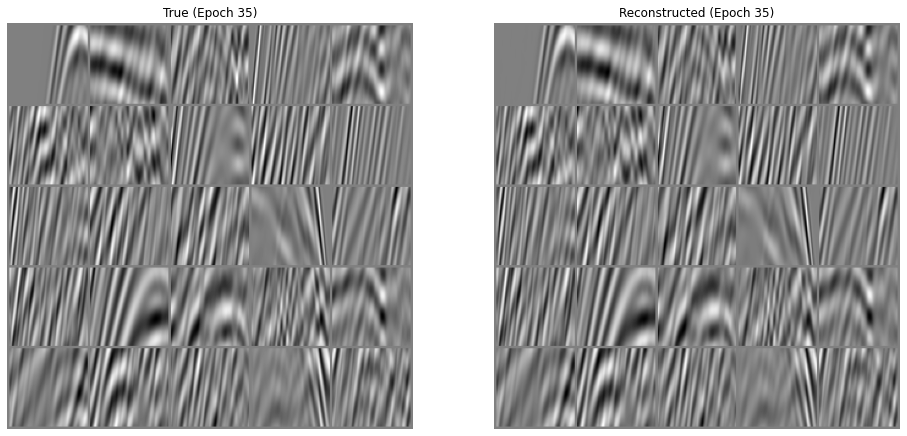

Validation: 0it [00:00, ?it/s]

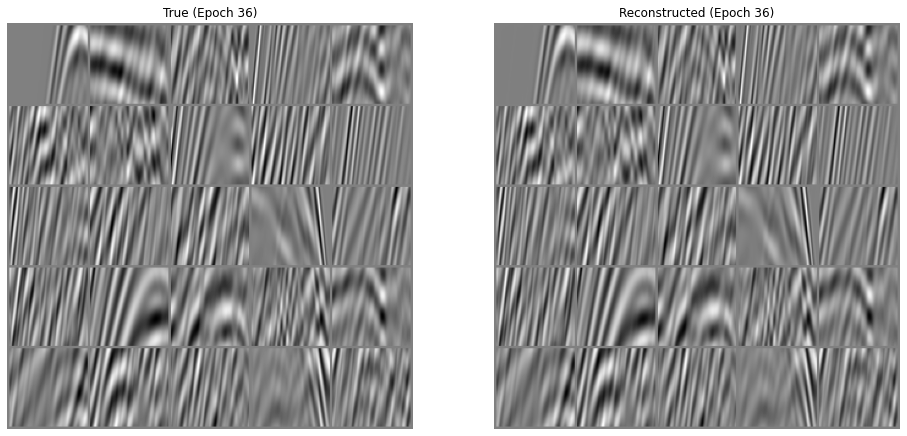

Validation: 0it [00:00, ?it/s]

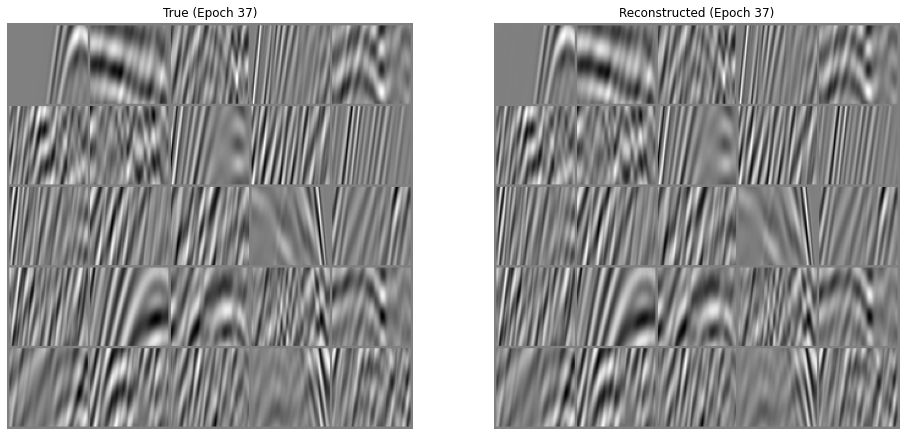

Validation: 0it [00:00, ?it/s]

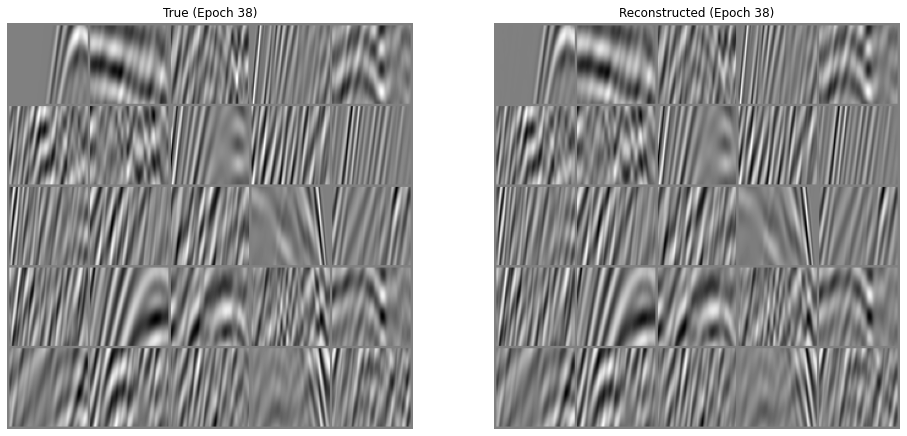

Validation: 0it [00:00, ?it/s]

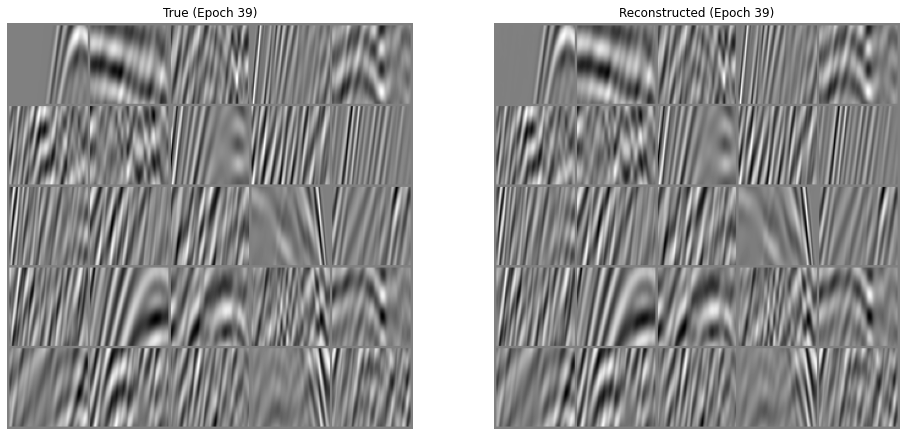

Validation: 0it [00:00, ?it/s]

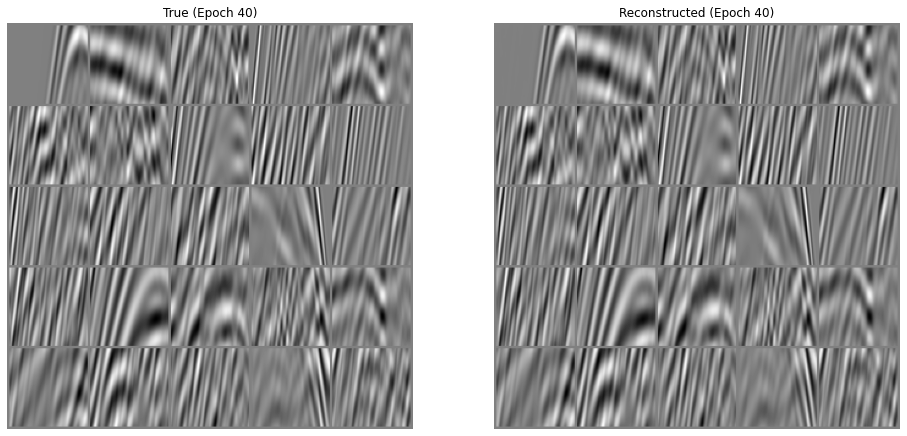

INFO: `Trainer.fit` stopped: `max_epochs=40` reached.


In [12]:
print('Working with Experiment %d - %s' % (iexp, expname))

# Create directory to save training evolution
figdir = os.path.join(outputfigs, 'exp%d' % iexp)

if figdir is not None:
    if not os.path.exists(figdir):
        os.mkdir(figdir)

# Create model to train
autoencoder = aetype(nh=ntpatch, nw=nspatch, nenc=nenc, 
                     kernel_size=kernel_size, nfilts=nfilts, 
                     nlayers=nlayers, nlevels=nlevels,
                     restriction=RDupop_torch, 
                     convbias=convbias, act_fun=act_fun, 
                     downstride=downstride, downmode=downmode,
                     upmode=upmode, bnormlast=bnormlast,  
                     relu_enc=relu_enc, tanh_enc=tanh_enc, 
                     relu_dec=relu_dec, tanh_final=tanh_final,
                     patcher=Pop1_torch, npatches=npatches[0]*npatches[1],
                     patchesscaling=scalings)

# Create dataset
datamodule = DataModule(xs, valid_size=0.1, random_state=42, batch_size=batch_size)

# Callbacks
early_stop_callback = pl_EarlyStopping(monitor="val_loss",
                                       mode="min",
                                       patience=es_patience,
                                       min_delta=es_min_delta)
callback = MetricsCallback(loss)
callback1 = PlottingCallback(figdir)

# Training
dimred = LitAutoencoder(ntpatch, nspatch, nenc,
                        autoencoder, loss, num_epochs, lossweights=lossweights,
                        learning_rate=learning_rate, weight_decay=weight_decay, betas=betas,
                        adapt_learning=True, lr_scheduler=lr_scheduler, lr_factor=lr_factor,
                        lr_thresh=lr_thresh, lr_patience=lr_patience, lr_max=lr_max,
                        noise_std=noise_std, mask_perc=mask_perc, device=device)

trainer = pl.Trainer(accelerator='gpu', devices=[devicenum, ], 
                     max_epochs=dimred.num_epochs, log_every_n_steps=4, 
                     callbacks=[early_stop_callback, callback, callback1])
trainer.fit(dimred, datamodule)

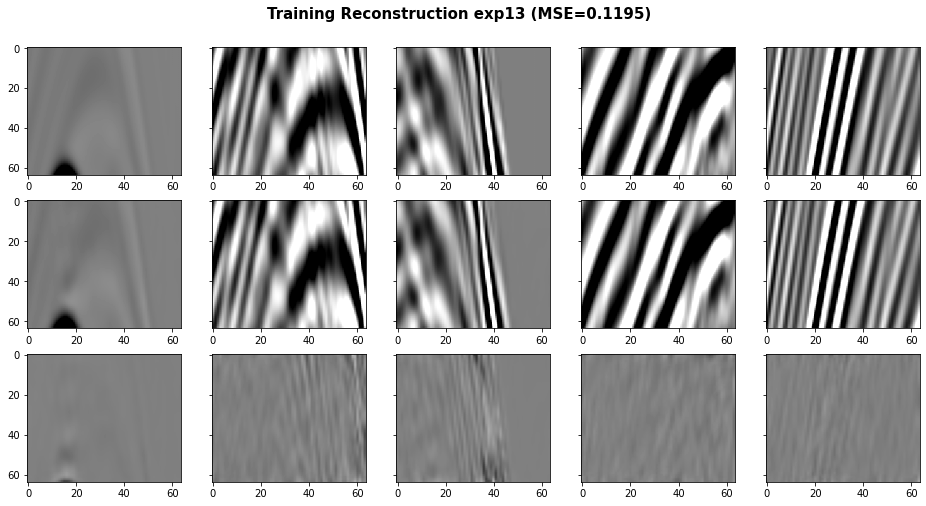

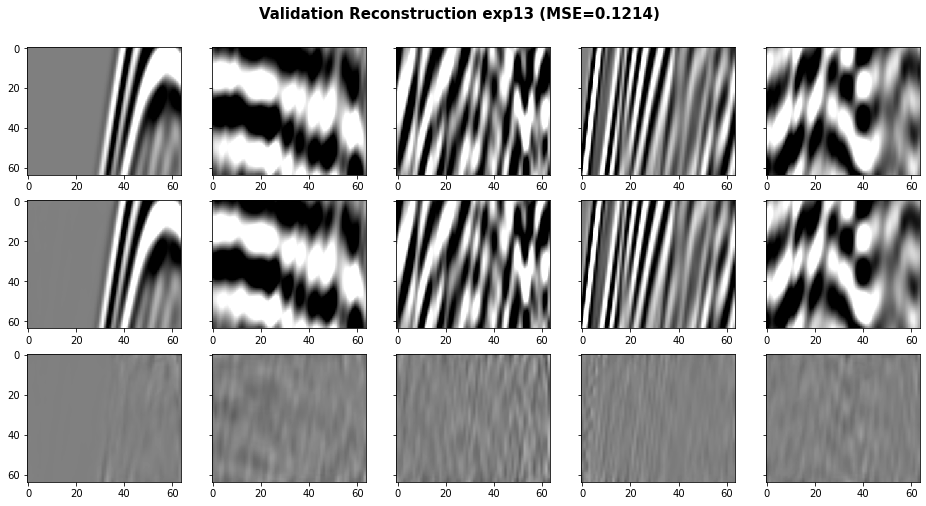

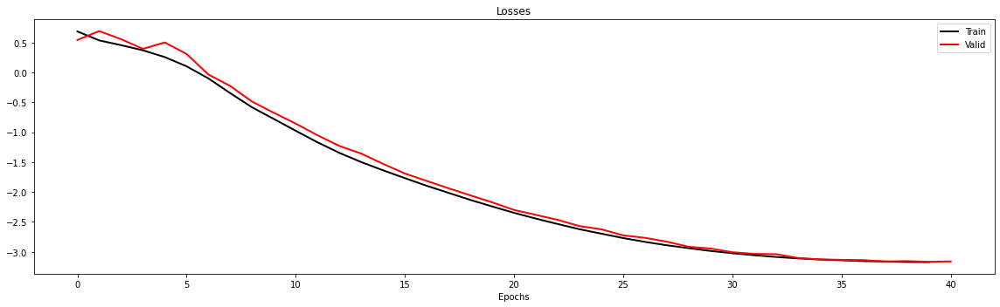

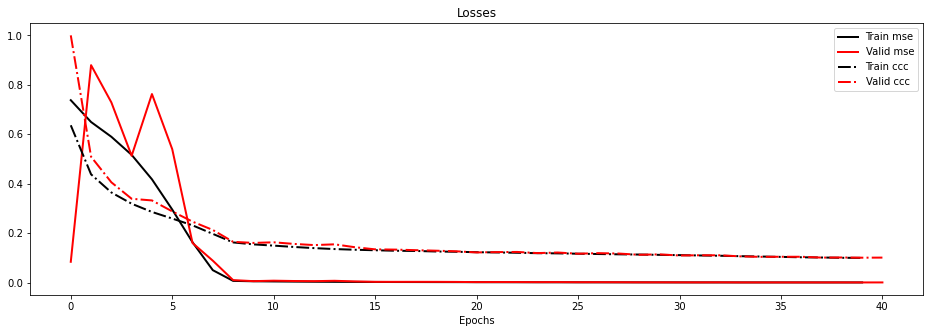

In [21]:
# Predict by manually piping encoder and decoder and visualize
nstats = 100
nviz = 5
cmax = 0.3


autoencoder.cuda(devicenum)
autoencoder.eval()
x_train = datamodule.x_train
x_valid = datamodule.x_valid

x_train_latent = torch.from_numpy(x_train[:nstats].astype(np.float32)).view(nstats, 1, nspatch, ntpatch).to(device)
latent = autoencoder.encode(x_train_latent)
x_train_ae = autoencoder.decode(latent)
x_train_mse = np.linalg.norm(x_train[:nstats].ravel() - x_train_ae[:nstats].detach().cpu().numpy().ravel()) / nstats
fig, axs = plt.subplots(3, nviz, sharey=True, figsize=(16, 8))
plt.suptitle(f'Training Reconstruction exp{iexp} (MSE={x_train_mse:.4f})',
             y=0.95, fontsize=15, fontweight='bold')
for i in range(nviz):
    # display original
    axs[0, i].imshow(x_train[i].reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[0, i].axis('tight')
    # display reconstruction
    axs[1, i].imshow(x_train_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[1, i].axis('tight')
    # display error
    axs[2, i].imshow(x_train[i].reshape(nspatch, ntpatch).T - 
                     x_train_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[2, i].axis('tight')
plt.savefig(os.path.join(figdir, 'exp%d_train.png' % iexp))


x_valid_latent = torch.from_numpy(x_valid[:nstats].astype(np.float32)).view(nstats, 1, nspatch, ntpatch).to(device)
latent1 = autoencoder.encode(x_valid_latent)
x_valid_ae = autoencoder.decode(latent1)
x_valid_mse = np.linalg.norm(x_valid[:nstats].ravel() - x_valid_ae[:nstats].detach().cpu().numpy().ravel()) / nstats

fig, axs = plt.subplots(3, nviz, sharey=True, figsize=(16, 8))
plt.suptitle(f'Validation Reconstruction exp{iexp} (MSE={x_valid_mse:.4f})',
             y=0.95, fontsize=15, fontweight='bold')
for i in range(nviz):
    # display original
    axs[0, i].imshow(x_valid[i].reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[0, i].axis('tight')
    # display reconstruction
    axs[1, i].imshow(x_valid_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[1, i].axis('tight')
    # display error
    axs[2, i].imshow(x_valid[i].reshape(nspatch, ntpatch).T - 
                     x_valid_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[2, i].axis('tight')
plt.savefig(os.path.join(figdir, 'exp%d_valid.png' % iexp))


# Display training losses
if not loadmodel:
    fig, ax = plt.subplots(1, 1, figsize=(16, 5))
    ax.plot(callback.train_loss, 'k', lw=2, ms=10, label='Train')
    ax.plot(callback.valid_loss, 'r', lw=2, ms=10, label='Valid')
    ax.set_title('Losses')
    ax.set_xlabel('Epochs')
    ax.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(figdir, 'exp%d_trainingvalidhistory.png' % iexp))

    if isinstance(dimred.lossfunc, list):
        
        fig, ax = plt.subplots(1, 1 if lossweights is None else 2, figsize=(16, 5))
        ls = ['-', '-.', '--']
        for iloss, lossname in enumerate(dimred.losses_names):
            ax.plot(callback.train_losses[lossname], 'k', lw=2, ms=10, 
                    linestyle=ls[iloss], label='Train %s' % lossname)
            ax.plot(callback.valid_losses[lossname], 'r', lw=2, ms=10,
                    linestyle=ls[iloss], label='Valid %s' % lossname)
            ax.set_title('Losses')
        ax.legend()
        ax.set_xlabel('Epochs')

        #axs[1].semilogy(dimred.lr_history, 'k', lw=2, ms=10)
        #axs[1].set_title('LR History')
        #axs[1].set_xlabel('Epochs')

        #if lossweights is None:
        #    cols = ['r', 'b', 'g', 'y']
        #    for lossname, col in zip(dimred.lossweights_history.keys(), cols):
        #        axs[2].semilogy(dimred.lossweights_history[lossname], col, lw=2, ms=10, label=lossname)
        #    axs[2].legend()
        #    axs[2].set_xlabel('Epochs')
        #    fig.tight_layout()
        #    plt.savefig(os.path.join(figdir, 'exp%d_lrhistory.png' % iexp), bbox_inches='tight')

## Deghosting

In [14]:
print('Deghosting...')
autoencoder.train()
autoencoder.eval()

# Initial guess
patchesmask = Pop.H * dmask.ravel()
patchesmask = patchesmask.reshape(npatches[0]*npatches[1], 1, nspatch, ntpatch)
patchesmask_scaled = patchesmask / scalings.cpu().detach().numpy()
p0 = autoencoder.encode(torch.from_numpy(patchesmask_scaled.astype(np.float32)).to(device)).cpu().detach().numpy()

# Invert
inv = InvertAll(device, # device
                nenc, npatches[0] * npatches[1],
                autoencoder, autoencoder.patched_restricted_decode, autoencoder.patched_decode, # modelling ops
                nn.MSELoss(), 1., 80, # optimizer
                reg_ae=0., x0=p0, bounds=None
                )
minv, pinv = inv.scipy_invert(d_torch, torch.zeros(((nr, nt))).to(device))

# Recompute data from minv
if 'cuda' in str(device):
    dinv = cp.asnumpy(Dupop * cp.asarray(minv))
else:
    dinv = Dupop * minv

minv = minv.reshape(ns, nt)
dinv = dinv.reshape(ns, nt)

Deghosting...


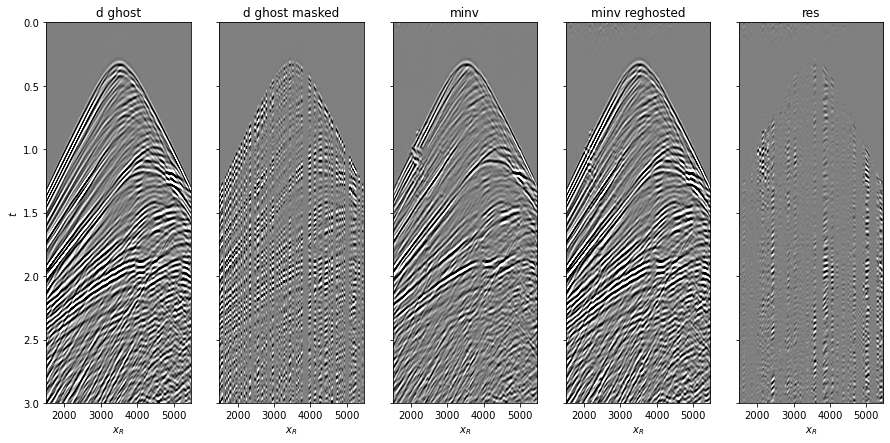

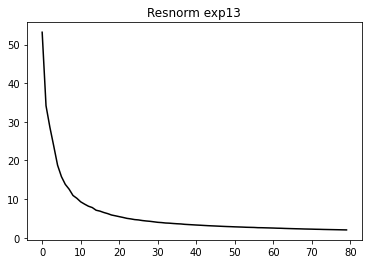

In [15]:
# Visualize
cmax = .5
pad = 4
tgain = np.exp(0.5*t)

fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 7))
axs[0].imshow(dfull[pad:-pad].T * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[0].set_title('d ghost')
axs[0].set_xlabel(r'$x_R$')
axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dmask[pad:-pad].T * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[1].set_title('d ghost masked')
axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(minv[pad:-pad].T * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[2].set_title('minv')
axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(dinv[pad:-pad].T * tgain[:, np.newaxis], cmap='gray',  vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[3].set_title('minv reghosted')
axs[3].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[4].imshow((dfull[pad:-pad].T-dinv[pad:-pad].T ) * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[4].set_title('res')
axs[4].set_xlabel(r'$x_R$')
axs[4].axis('tight')
axs[4].set_ylim(3, 0)
plt.savefig(os.path.join(figdir, f'exp{iexp}_deghosting.png'))

plt.figure()
plt.plot(inv.resnorm, 'k')
plt.title(f'Resnorm exp{iexp}');